# DAILY FORECASTING

## IMPORTS

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
color_pal = sns.color_palette()
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.exp_smoothing import ExponentialSmoothing
from sktime.forecasting.arima import AutoARIMA
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.model_selection import ExpandingWindowSplitter
from sktime.forecasting.model_evaluation import evaluate
from sktime.forecasting.model_selection import ForecastingGridSearchCV
from sktime.forecasting.compose import make_reduction
from sktime.forecasting.compose import EnsembleForecaster
from sktime.performance_metrics.forecasting import MeanAbsoluteError
from sktime.performance_metrics.forecasting import MeanSquaredError
from sktime.performance_metrics.forecasting import MeanAbsolutePercentageError
from sklearn.neural_network import MLPRegressor
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings("ignore")

## FUNCTIONS

In [2]:
def ADFtest(mydata):
    adf = adfuller(mydata)
    if adf[0] >= adf[4]['5%']:
        print(' is not stationary')
    else:
        print('is stationary')

In [3]:
def residuals_plots(residuals):
   fig = plt.figure(figsize=(5.5, 3.5), layout="constrained")
   spec = fig.add_gridspec(3, 2)
#plot
   ax1 = fig.add_subplot(spec[0, :])
   residuals.plot(style='-', figsize=(80,80), color='blue', linewidth=8, ax = ax1)
   ax1.set_xlabel('Time', fontsize = 80)
   ax1.xaxis.set_tick_params(labelsize=80)
   ax1.set_ylabel('errors', fontsize = 80)
   ax1.yaxis.set_tick_params(labelsize=80)
   ax1.set_title('RESIDUALS', fontsize= 90)
   ax1.legend().set_visible(False)
   ax1.grid(linewidth=6)
   ax1.spines['top'].set_linewidth(3)
   ax1.spines['right'].set_linewidth(3)
   ax1.spines['left'].set_linewidth(3)
   ax1.spines['bottom'].set_linewidth(3)
#histogram
   ax2 = fig.add_subplot(spec[1, :])
   residuals.plot(kind='hist', bins=10, figsize=(80,80), ax = ax2)
   ax2.set_xlabel('Price', fontsize = 80)
   ax2.xaxis.set_tick_params(labelsize=80)
   ax2.set_ylabel('Frequency', fontsize =80)
   ax2.yaxis.set_tick_params(labelsize=80)
   ax2.set_title('HISTOGRAM', fontsize= 90)
   ax2.legend().set_visible(False)
   ax2.grid(linewidth=6)
   ax2.spines['top'].set_linewidth(3)
   ax2.spines['right'].set_linewidth(3)
   ax2.spines['left'].set_linewidth(3)
   ax2.spines['bottom'].set_linewidth(3)
#acf plot
   ax3 = fig.add_subplot(spec[2, 0])
   plot_acf(residuals,zero=False, ax=ax3, lags= 14, linewidth = 8, vlines_kwargs={"linewidth": 8})
   ax3.set_xticks(np.arange(1,15))
   ax3.set_ylim([-.2,.2]) 
   ax3.xaxis.set_tick_params(labelsize=80)
   ax3.yaxis.set_tick_params(labelsize=80)
   ax3.set_title('AUTOCORRELATION', fontsize= 90)
   ax3.spines['top'].set_linewidth(3)
   ax3.spines['right'].set_linewidth(3)
   ax3.spines['left'].set_linewidth(3)
   ax3.spines['bottom'].set_linewidth(3)
#pacf plot
   ax4 = fig.add_subplot(spec[2, 1])
   plot_pacf(residuals,zero=False, ax=ax4, lags = 14, linewidth = 8, vlines_kwargs={"linewidth": 8})
   ax4.set_xticks(np.arange(1,15))
   ax4.set_ylim([-.2,.2]) 
   ax4.xaxis.set_tick_params(labelsize=80)
   ax4.yaxis.set_tick_params(labelsize=80)
   ax4.set_title('PARTIAL AUTOCORRELATION', fontsize= 90)
   ax4.spines['top'].set_linewidth(3)
   ax4.spines['right'].set_linewidth(3)
   ax4.spines['left'].set_linewidth(3)
   ax4.spines['bottom'].set_linewidth(3)

   fig.tight_layout(pad=10)
   plt.show()

In [4]:
def nn_residuals(window_size,estimator):
    frame = train.copy()
    for window in range(1, window_size+1):
        frame[f"lag {str(window)}"] = train.shift(window)        
    frame= frame.dropna()    
    y = frame['price']
    X = frame.loc[:,frame.columns != 'price']       
    estimator.fit(X,y)    
    fitted_values = pd.Series(estimator.predict(X), index = train[window_size:].index)    
    residuals = y - fitted_values   
    return residuals

# ANALYSIS

## main data

In [5]:
maindata = pd.read_excel('merge_file_EnEx.xlsx', dtype = ({'time': np.dtype(str) , 'price': np.float64}))
maindata = maindata.set_index('time')
maindata.index = pd.to_datetime(maindata.index)
maindata

,price
time,
2020-11-01 00:00:00,59.52
2020-11-01 01:00:00,59.01
2020-11-01 02:00:00,59.01
2020-11-01 03:00:00,59.01
2020-11-01 04:00:00,59.01
...,...
2023-02-28 19:00:00,194.18
2023-02-28 20:00:00,174.69
2023-02-28 21:00:00,159.57


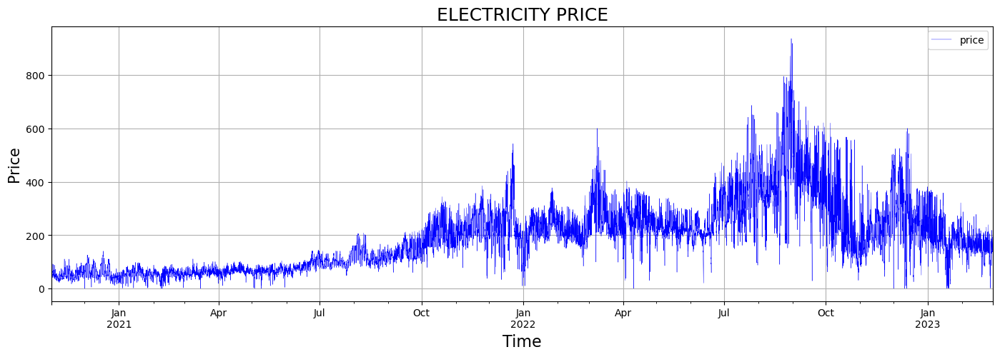

In [6]:
maindata.plot(style='-', figsize=(17,5), color='blue', linewidth=0.3)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Price', fontsize = 15)
plt.title('ELECTRICITY PRICE', fontsize= 18)
plt.grid()
plt.show()

## fill NaN

In [7]:
np.where(np.isnan(maindata))

(array([ 3551, 12287], dtype=int64), array([0, 0], dtype=int64))

In [8]:
maindata.iloc[3551] = maindata.iloc[3551-168]

In [9]:
maindata.iloc[12287] = maindata.iloc[12287-168]

In [10]:
np.where(np.isnan(maindata))

(array([], dtype=int64), array([], dtype=int64))

## Daily data

In [11]:
data = maindata.resample('D').mean()

In [12]:
len(data)

850

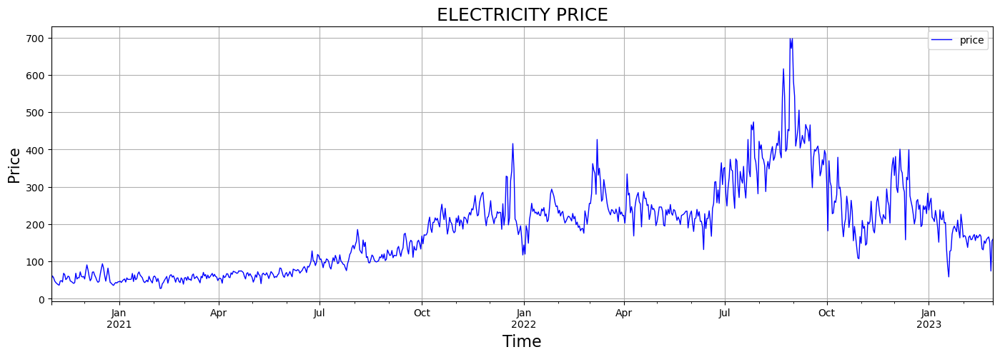

In [13]:
data.plot(style='-', figsize=(17,5), color='blue', linewidth=1)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Price', fontsize = 15)
plt.title('ELECTRICITY PRICE', fontsize= 18)
plt.grid()
plt.show()

## cross validation

In [14]:
cv= ExpandingWindowSplitter(initial_window = 800, fh= np.arange(1,8), step_length = 1)

## split train-test data

In [15]:
train,test = temporal_train_test_split(data,test_size=50)

In [16]:
len(train)

800

# FORECASTERS

## SEASONAL NAIVE FORECASTER

In [36]:
snforecaster = NaiveForecaster('last', sp=7)
snforecaster.fit(train)

NaiveForecaster(sp=7)

## residuals

In [37]:
snresid = snforecaster.predict_residuals(train)

In [19]:
residuals_plots(snresid.dropna())

## forecast

In [48]:
cv_seasonalnaive1 = evaluate(strategy='refit', forecaster=snforecaster, cv=cv, y=data, return_data=True, scoring=MeanSquaredError(square_root=True))
cv_seasonalnaive2 = evaluate(strategy='refit', forecaster=snforecaster, cv=cv, y=data, return_data=True, scoring=None)
cv_seasonalnaive3 = evaluate(strategy='refit', forecaster=snforecaster, cv=cv, y=data, return_data=True, scoring=MeanAbsoluteError())

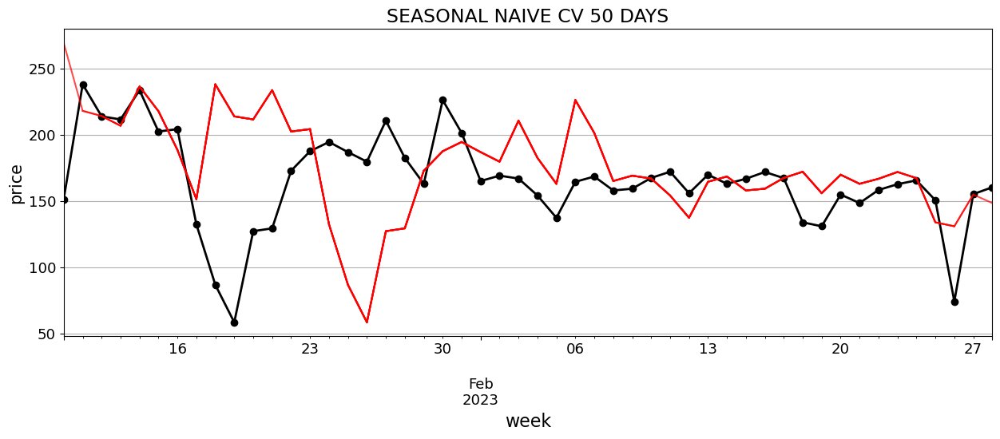

In [25]:
ax = data.iloc[-50:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_seasonalnaive1)):
  cv_seasonalnaive1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha= .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('SEASONAL NAIVE CV 50 DAYS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [49]:
snRMSEtrain = np.sqrt(np.square(snresid['price']).mean())
snMAPEtrain = np.absolute(snresid['price']).mean()
snMAEtrain = np.absolute(snresid['price']/train['price']).mean()

## test metrics

In [50]:
snRMSEtest = np.sqrt(cv_seasonalnaive1["test_MeanSquaredError"]).mean()
snMAPEtest = cv_seasonalnaive2["test_MeanAbsolutePercentageError"].mean()
snMAEtest = cv_seasonalnaive3["test_MeanAbsoluteError"].mean()

## ARIMA FORECASTER

## orders selection

In [23]:
log_data = np.log(data)
ADFtest(log_data)

 is not stationary


In [24]:
datasd = log_data.diff(7).dropna()
ADFtest(datasd)

is stationary


In [25]:
fig = plt.figure(figsize=(5.5, 3.5), layout="constrained")
spec = fig.add_gridspec(3, 2)

#logged data
ax1 = fig.add_subplot(spec[0, :])
log_data.plot(style='-', figsize=(80,80), color='blue', linewidth=6, ax = ax1)
ax1.set_xlabel('Time', fontsize = 80)
ax1.xaxis.set_tick_params(labelsize=80)
ax1.set_ylabel('logged price', fontsize = 80)
ax1.yaxis.set_tick_params(labelsize=80)
ax1.set_title('LOGGED DATA', fontsize= 90)
ax1.legend().set_visible(False)
ax1.grid(linewidth=6)
ax1.spines['top'].set_linewidth(3)
ax1.spines['right'].set_linewidth(3)
ax1.spines['left'].set_linewidth(3)
ax1.spines['bottom'].set_linewidth(3)

#diff logged data
ax2 = fig.add_subplot(spec[1, :])
datasd.plot(style='-', figsize=(80,80), color='blue', linewidth=6, ax = ax2)
ax2.set_xlabel('Time', fontsize = 80)
ax2.xaxis.set_tick_params(labelsize=80)
ax2.set_ylabel('diff price', fontsize =80)
ax2.yaxis.set_tick_params(labelsize=80)
ax2.set_title('DIFF LOGGED DATA', fontsize= 90)
ax2.legend().set_visible(False)
ax2.grid(linewidth=6)
ax2.spines['top'].set_linewidth(3)
ax2.spines['right'].set_linewidth(3)
ax2.spines['left'].set_linewidth(3)
ax2.spines['bottom'].set_linewidth(3)

#acf plot
ax3 = fig.add_subplot(spec[2, 0])
plot_acf(datasd,zero=False, ax=ax3, lags= 14, linewidth = 10, vlines_kwargs={"linewidth": 10})
ax3.xaxis.set_tick_params(labelsize=80)
ax3.yaxis.set_tick_params(labelsize=80)
ax3.set_ylim([-.75,.75]) 
ax3.set_title('AUTOCORRELATION', fontsize= 90)
ax3.spines['top'].set_linewidth(3)
ax3.spines['right'].set_linewidth(3)
ax3.spines['left'].set_linewidth(3)
ax3.spines['bottom'].set_linewidth(3)

#pacf plot
ax4 = fig.add_subplot(spec[2, 1])
plot_pacf(datasd,zero=False, ax=ax4, lags = 14, linewidth = 10, vlines_kwargs={"linewidth": 10})
ax4.xaxis.set_tick_params(labelsize=80)
ax4.yaxis.set_tick_params(labelsize=80)
ax4.set_ylim([-.75,.75]) 
ax4.set_title('PARTIAL AUTOCORRELATION', fontsize= 90)
ax4.spines['top'].set_linewidth(3)
ax4.spines['right'].set_linewidth(3)
ax4.spines['left'].set_linewidth(3)
ax4.spines['bottom'].set_linewidth(3)

fig.tight_layout(pad=10)
plt.show()

In [38]:
aforecaster = ARIMA( order = (0,0,4), seasonal_order= (0,1,1,7))
aforecaster.fit(train)

ARIMA(order=(0, 0, 4), seasonal_order=(0, 1, 1, 7))

In [27]:
aforecaster.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  800
Model:             SARIMAX(0, 0, 4)x(0, 1, [1], 7)   Log Likelihood               -3885.939
Date:                             Sun, 25 Jun 2023   AIC                           7785.877
Time:                                     14:37:17   BIC                           7818.608
Sample:                                 11-01-2020   HQIC                          7798.456
                                      - 01-09-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.7349      1.037      1.673      0.094      -0.298       3.768
ma.L1          0.7881      0.024     32.191      0.000       0.740       0.836
ma.L2          0.6450      0.028     22.828      0.000       0.590       0.700
ma.L3          0.3349      0.029     11.501      0.000       0.278       0.392
ma.L4          0.1723      0.025      6.819      0.000       0.123       0.222
ma.S.L7       -0.6983      0.018    -38.588      0.000      -0.734      -0.663
sigma2      1049.3283     31.845     32.951      0.000     986.913    1111.743
===================================================================================
Ljung-Box (L1) (Q):                   0.45   Jarque-Bera (JB):               547.35
Prob(Q):                              0.50   Prob(JB):                         0.00
Heteroskedasticity (H):              29.44   Skew:                             0.19
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## residuals

In [39]:
aresid = aforecaster.predict_residuals(train)

In [34]:
residuals_plots(aresid)

## forecast

In [65]:
cv_arima1 = evaluate(strategy='refit', forecaster=aforecaster, cv=cv, y=data, return_data=True, scoring=MeanSquaredError(square_root=True))
cv_arima2 = evaluate(strategy='refit', forecaster=aforecaster, cv=cv, y=data, return_data=True, scoring = None)
cv_arima3 = evaluate(strategy='refit', forecaster=aforecaster, cv=cv, y=data, return_data=True, scoring = MeanAbsoluteError())

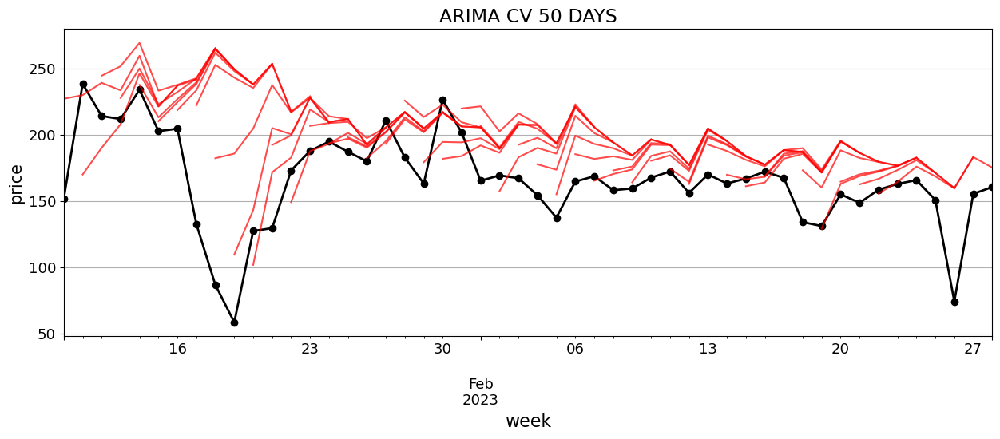

In [36]:
ax = data.iloc[-50:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_arima1)):
  cv_arima1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha= .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('ARIMA CV 50 DAYS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [63]:
aRMSEtrain = np.sqrt(np.square(aresid['price']).mean())
aMAPEtrain = np.absolute(aresid['price']).mean()
aMAEtrain = np.absolute(aresid['price']/train['price']).mean()

## test metrics

In [66]:
aRMSEtest = np.sqrt(cv_arima1["test_MeanSquaredError"]).mean()
aMAPEtest = cv_arima2["test_MeanAbsolutePercentageError"].mean()
aMAEtest = cv_arima3["test_MeanAbsoluteError"].mean()

## AUTOARIMA FORECASTER

## orders selection

In [17]:
autoforecaster = AutoARIMA(sp=7, D=1, d=0)

In [18]:
autoforecaster.fit(data)

AutoARIMA(D=1, d=0, sp=7)

In [41]:
autoforecaster.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                  850
Model:             SARIMAX(2, 0, 2)x(2, 1, 2, 7)   Log Likelihood               -4060.721
Date:                           Thu, 22 Jun 2023   AIC                           8141.441
Time:                                   20:21:49   BIC                           8188.811
Sample:                               11-01-2020   HQIC                          8159.593
                                    - 02-28-2023                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.4005      0.280      1.430      0.153      -0.148       0.949
ar.L1         -0.0094      0.045     -0.207      0.836      -0.098       0.079
ar.L2          0.8540      0.044     19.562      0.000       0.768       0.940
ma.L1          0.7461      0.054     13.857      0.000       0.641       0.852
ma.L2         -0.1211      0.031     -3.956      0.000      -0.181      -0.061
ar.S.L7       -0.7761      0.088     -8.822      0.000      -0.948      -0.604
ar.S.L14       0.1214      0.030      4.109      0.000       0.064       0.179
ma.S.L7       -0.0635      0.087     -0.730      0.465      -0.234       0.107
ma.S.L14      -0.7968      0.078    -10.218      0.000      -0.950      -0.644
sigma2       880.3759     24.968     35.260      0.000     831.439     929.312
===================================================================================
Ljung-Box (L1) (Q):                   0.27   Jarque-Bera (JB):              1116.76
Prob(Q):                              0.60   Prob(JB):                         0.00
Heteroskedasticity (H):              21.68   Skew:                             0.35
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [42]:
aaforecaster = ARIMA(order = (2,0,2), seasonal_order = (2,1,2,7), with_intercept=False)
aaforecaster.fit(train)

ARIMA(order=(2, 0, 2), seasonal_order=(2, 1, 2, 7), with_intercept=False)

## residuals

In [43]:
aaresid = aaforecaster.predict_residuals(train)

In [25]:
residuals_plots(aaresid)

## forecast

In [59]:
cv_autoarima1 = evaluate(strategy='refit',forecaster=aaforecaster,cv=cv,y=data,return_data=True,scoring=MeanSquaredError(square_root=True))
cv_autoarima2 = evaluate(strategy='refit',forecaster=aaforecaster,cv=cv,y=data,return_data=True, scoring = None)
cv_autoarima3 = evaluate(strategy='refit',forecaster=aaforecaster,cv=cv,y=data,return_data=True, scoring = MeanAbsoluteError())

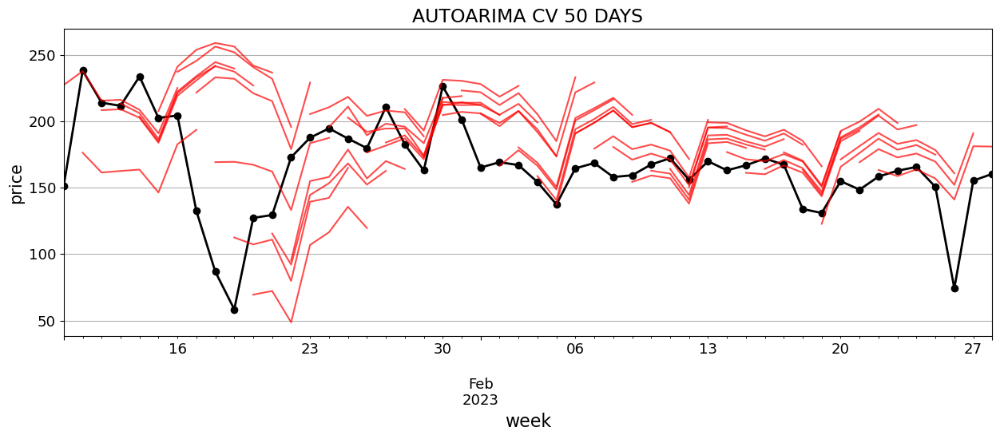

In [47]:
ax = data.iloc[-50:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_autoarima1)):
  cv_autoarima1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha= .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('AUTOARIMA CV 50 DAYS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [60]:
aaRMSEtrain = np.sqrt(np.square(aaresid['price']).mean())
aaMAPEtrain = np.absolute(aaresid['price']).mean()
aaMAEtrain = np.absolute(aaresid['price']/train['price']).mean()

## test metrics

In [61]:
aaRMSEtest = np.sqrt(cv_autoarima1["test_MeanSquaredError"]).mean()
aaMAPEtest = cv_autoarima2["test_MeanAbsolutePercentageError"].mean()
aaMAEtest = cv_autoarima3["test_MeanAbsoluteError"].mean()

## EXPONENTIAL SMOOTHING FORECASTER

In [27]:
esforecaster = ExponentialSmoothing(sp=7, trend = 'add', seasonal = 'multiplicative')
esforecaster.fit(train)

ExponentialSmoothing(seasonal='multiplicative', sp=7, trend='add')

## residuals

In [28]:
esresid = esforecaster.predict_residuals(train)

In [35]:
residuals_plots(esresid)

## forecast

In [51]:
cv_ETS1 = evaluate(strategy='refit',forecaster=esforecaster,cv=cv,y=data,return_data=True,scoring=MeanSquaredError(square_root=True))
cv_ETS2 = evaluate(strategy='refit',forecaster=esforecaster,cv=cv,y=data,return_data=True, scoring= None)
cv_ETS3 = evaluate(strategy='refit',forecaster=esforecaster,cv=cv,y=data,return_data=True, scoring= MeanAbsoluteError())

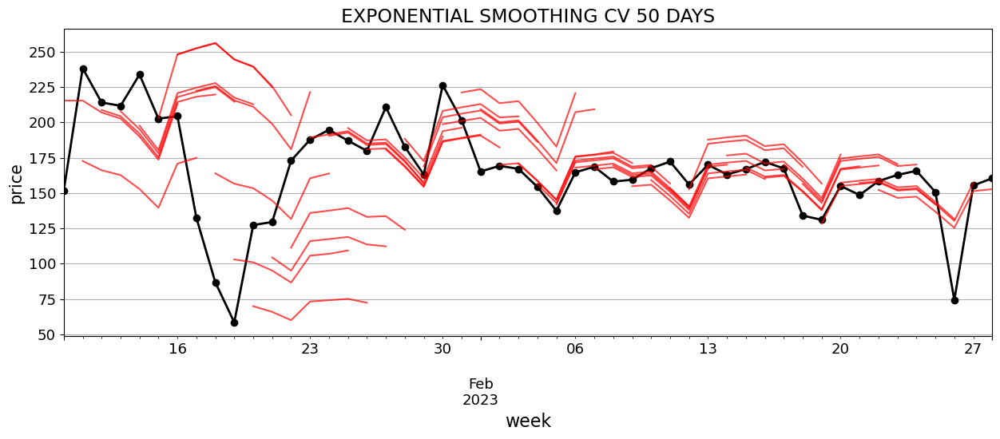

In [31]:
ax = data.iloc[-50:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_ETS1)):
  cv_ETS1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha = .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('EXPONENTIAL SMOOTHING CV 50 DAYS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [52]:
esRMSEtrain = np.sqrt(np.square(esresid['price']).mean())
esMAPEtrain = np.absolute(esresid['price']).mean()
esMAEtrain = np.absolute(esresid['price']/train['price']).mean()

## test metrics

In [53]:
esRMSEtest = np.sqrt(cv_ETS1["test_MeanSquaredError"]).mean()
esMAPEtest = cv_ETS2["test_MeanAbsolutePercentageError"].mean()
esMAEtest = cv_ETS3["test_MeanAbsoluteError"].mean()

## NEUTRAL NETWORKS

## forecasting grid search

In [68]:
cv1= ExpandingWindowSplitter(initial_window = 750, fh= np.arange(1,8), step_length = 1)

In [69]:
lst = []
k_values = range(10,120,10)
for k in k_values:
    lst.append(k,)
i_values = range(10,120,10)
j_values = range(10,120,10)
for i in i_values:
    for j in j_values:
        lst.append((i,j,))

In [70]:
parameters= {'estimator__hidden_layer_sizes': lst,
         'estimator__early_stopping': [True, False],
             'estimator__shuffle': [True, False],
             'window_length': [7,14,21]}

In [71]:
regressor = MLPRegressor(random_state=1, max_iter = 707)
forecaster = make_reduction(estimator = regressor, strategy='recursive')

In [72]:
grid_search = ForecastingGridSearchCV(forecaster = forecaster, cv=cv1, n_jobs =-1, param_grid = parameters, scoring=MeanSquaredError(square_root=True))

In [73]:
grid_search.fit(train)

ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([1, 2, 3, 4, 5, 6, 7]),
                                                   initial_window=750),
                        forecaster=RecursiveTabularRegressionForecaster(estimator=MLPRegressor(max_iter=707,
                                                                                               random_state=1)),
                        n_jobs=-1,
                        param_grid={'estimator__early_stopping': [True, False],
                                    'estimator__hidden_layer_sizes': [10, 20,
                                                                      30, 40,
                                                                      50, 60,
                                                                      70, 80,
                                                                      90, 100,
                                                                      110,
                                         

In [74]:
grid_search.best_params_

{'estimator__early_stopping': False,
 'estimator__hidden_layer_sizes': (20, 30),
 'estimator__shuffle': True,
 'window_length': 14}

In [75]:
model = MLPRegressor(max_iter=707, hidden_layer_sizes=(20,30,), random_state= 1, shuffle=True, early_stopping=False)
nnforecaster = make_reduction(estimator = model, strategy='recursive', window_length=14)
nnforecaster.fit(train)

RecursiveTabularRegressionForecaster(estimator=MLPRegressor(hidden_layer_sizes=(20,
                                                                                30),
                                                            max_iter=707,
                                                            random_state=1),
                                     window_length=14)

## residuals

In [76]:
nnresid = nn_residuals(14,MLPRegressor(max_iter=707, hidden_layer_sizes=(20,30,), random_state= 1, shuffle=True, early_stopping=False))

In [77]:
nnresid = pd.DataFrame(nnresid, train.index)

In [78]:
nnresid = nnresid.rename(columns = {0:'price'})

In [94]:
residuals_plots(nnresid.dropna())

## forecast

In [95]:
cv_nn1 = evaluate(strategy='refit',forecaster=nnforecaster,cv=cv,y=data, return_data=True, scoring=MeanSquaredError(square_root=True), n_jobs =-1)
cv_nn2 = evaluate(strategy='refit',forecaster=nnforecaster,cv=cv,y=data, return_data=True)
cv_nn3 = evaluate(strategy='refit',forecaster=nnforecaster,cv=cv,y=data, return_data=True, scoring= MeanAbsoluteError())

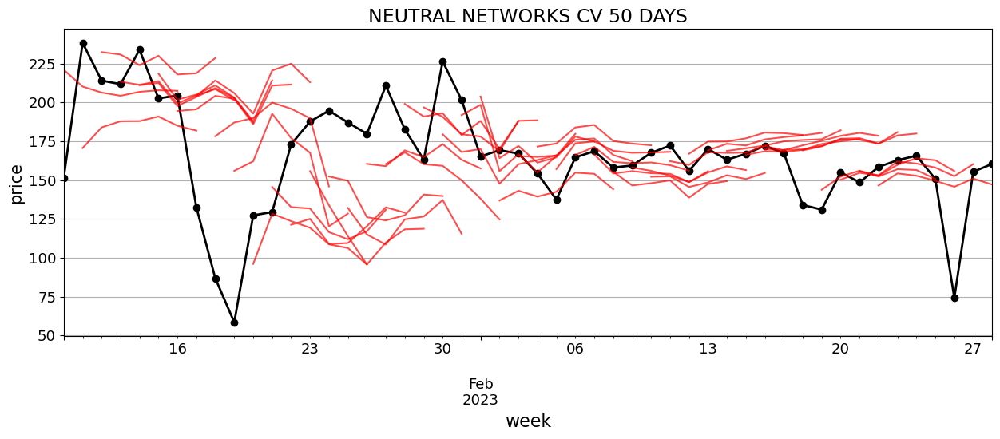

In [96]:
ax = data.iloc[-50:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_nn1)):
  cv_nn1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha = .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('NEUTRAL NETWORKS CV 50 DAYS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [82]:
nnRMSEtrain = np.sqrt(np.square(nnresid['price']).mean())
nnMAPEtrain = np.absolute(nnresid['price']).mean()
nnMAEtrain = np.absolute(nnresid['price']/train['price']).mean()

## test metrics

In [83]:
nnRMSEtest = np.sqrt(cv_nn1["test_MeanSquaredError"]).mean()
nnMAPEtest = cv_nn2["test_MeanAbsolutePercentageError"].mean()
nnMAEtest = cv_nn3["test_MeanAbsoluteError"].mean()

## ENSEMBLE FORECASTER

In [84]:
estimator = MLPRegressor(max_iter=707, hidden_layer_sizes=(20,30,), random_state= 1, shuffle=True, early_stopping=False)
model1 = make_reduction(estimator = estimator, strategy='recursive', window_length=14)
model2 = ExponentialSmoothing(trend="add", seasonal="multiplicative", sp=7)
model3 = ARIMA( order = (0,0,4), seasonal_order= (0,1,1,7))
model4 = NaiveForecaster('last', sp = 7)
model5 = ARIMA( order = (2,0,2), seasonal_order= (2,1,2,7))
forecasters = [('neural networks',model1),('exponential smoothing',model2),('ARIMA',model3),('Seasonal Naive',model4),('AutoARIMA',model5)]
enforecaster = EnsembleForecaster(forecasters=forecasters, n_jobs=-1)
enforecaster.fit(train)

EnsembleForecaster(forecasters=[('neural networks',
                                 RecursiveTabularRegressionForecaster(estimator=MLPRegressor(hidden_layer_sizes=(20,
                                                                                                                 30),
                                                                                             max_iter=707,
                                                                                             random_state=1),
                                                                      window_length=14)),
                                ('exponential smoothing',
                                 ExponentialSmoothing(seasonal='multiplicative',
                                                      sp=7, trend='add')),
                                ('ARIMA',
                                 ARIMA(order=(0, 0, 4),
                                       seasonal_order=(0, 1, 1, 7))),
                        

## residuals

In [85]:
enresid = (snresid + aresid + aaresid + esresid + nnresid)/5

In [97]:
residuals_plots(enresid.dropna())

## forecast

In [87]:
cv_ensemble1 = evaluate(strategy='refit',forecaster=enforecaster,cv=cv,y=data, return_data=True, scoring=MeanSquaredError(square_root=True))
cv_ensemble2 = evaluate(strategy='refit',forecaster=enforecaster,cv=cv,y=data, return_data=True)
cv_ensemble3 = evaluate(strategy='refit',forecaster=enforecaster,cv=cv,y=data, return_data=True, scoring=MeanAbsoluteError())

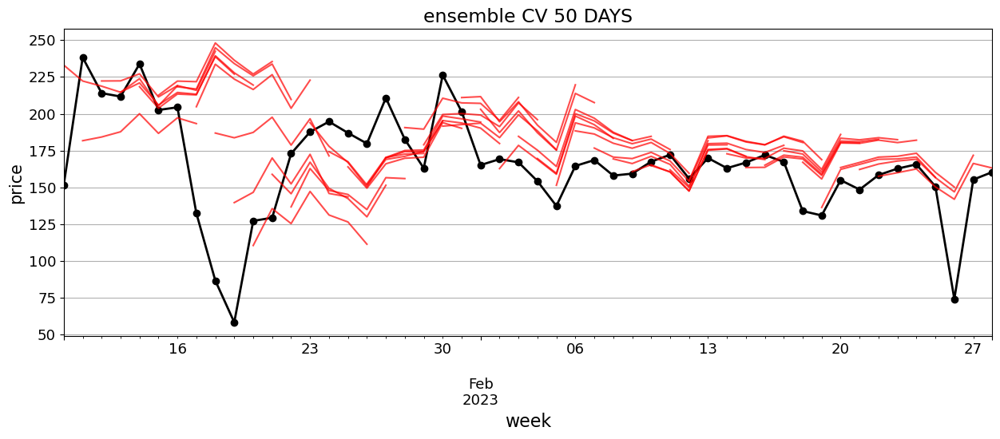

In [88]:
ax = data.iloc[-50:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_ensemble1)):
  cv_ensemble1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha = .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('ensemble CV 50 DAYS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [89]:
enRMSEtrain = np.sqrt(np.square(enresid['price']).mean())
enMAPEtrain = np.absolute(enresid['price']).mean()
enMAEtrain = np.absolute(enresid['price']/train['price']).mean()

## test metrics

In [90]:
enRMSEtest = np.sqrt(cv_ensemble1["test_MeanSquaredError"]).mean()
enMAPEtest = cv_ensemble2["test_MeanAbsolutePercentageError"].mean()
enMAEtest = cv_ensemble3["test_MeanAbsoluteError"].mean()

## TOTAL METRICS

## train metrics

In [91]:
names = ('Daily Seasonal naive forecaster','Daily ARIMA forecaster', 'Daily AUTOARIMA forecaster','Daily exponential smoothing forecaster', 'Daily neutral network', 'Daily ensemble') 
values = {'RMSE': [snRMSEtrain, aRMSEtrain, aaRMSEtrain, esRMSEtrain, nnRMSEtrain, enRMSEtrain], 'MAPE': [snMAPEtrain, aMAPEtrain, aaMAPEtrain, esMAPEtrain, nnMAPEtrain, enMAPEtrain], 'MAE': [snMAEtrain, aMAEtrain, aaMAEtrain, esMAEtrain, nnMAEtrain, enMAEtrain]}
metrics = pd.DataFrame(values, names)
metrics = metrics.sort_values(by=['RMSE'])
metrics.style.highlight_min()

,RMSE,MAPE,MAE
Daily neutral network,28.776439,18.073665,0.099646
Daily exponential smoothing forecaster,29.125434,18.466378,0.101350
Daily ensemble,29.609766,18.712338,0.100406
Daily AUTOARIMA forecaster,29.924306,19.125064,0.109089
Daily ARIMA forecaster,32.564339,21.195906,0.119853
Daily Seasonal naive forecaster,49.348341,31.276012,0.170298


## test metrics

In [92]:
names = ('Daily seasonal naive forecaster','Daily ARIMA forecaster', 'Daily AUTOARIMA forecaster','Daily exponential smoothing forecaster', 'Daily neutral network', 'Daily ensemble') 
values = {'RMSE': [snRMSEtest, aRMSEtest, aaRMSEtest, esRMSEtest, nnRMSEtest, enRMSEtest], 'MAPE': [snMAPEtest, aMAPEtest, aaMAPEtest, esMAPEtest, nnMAPEtest, enMAPEtest], 'MAE': [snMAEtest, aMAEtest, aaMAEtest, esMAEtest, nnMAEtest, enMAEtest]}
metrics = pd.DataFrame(values, names)
metrics = metrics.sort_values(by=['RMSE'])
metrics.style.highlight_min()

,RMSE,MAPE,MAE
Daily exponential smoothing forecaster,5.517122,0.246192,31.231899
Daily ensemble,5.693590,0.250512,30.329456
Daily neutral network,5.807316,0.245343,31.726052
Daily AUTOARIMA forecaster,6.223095,0.288417,36.251099
Daily ARIMA forecaster,6.250522,0.298529,36.534596
Daily seasonal naive forecaster,6.254974,0.276546,35.238194
